I wrote the following code by referring to https://github.com/yang-song/score_sde_pytorch

In [1]:
# Import requirements
import math
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

import torchvision.transforms as transforms

from torch import Tensor
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
from tqdm import tqdm

%matplotlib inline

In [2]:
# Training hyperparameters
total_epoch = 100
warmup_epoch = 10
grad_clip = 1.
batch_size = 64
lr = 1e-4

# Model hyperparameters
nc = 1
nf = 128

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
# Base model: NSCN, continous

# ------------------------------------ #
#     Forward SDE (Image -> Noise)     #
#     Sigma=0.01   ->     Sigma=50     #
#                                      #
#     Reverse SDE (Noise -> Image)     #
#     Sigma=50     ->   Sigma=0.01     #
# ------------------------------------ #

sigma_min = 0.01    # t=0, data
sigma_max = 50    # t=T, prior (noise) ~ N(0, 50^2)
N = 10000    # the number of discretization steps
T = 1    # t = (0, 1)  continous
sampling_eps = 0.001


def get_samples_from_prior(shape, sigma=sigma_max):
    # Get samples from prior distribution ~ N(0, sigma^2)
    return torch.randn(*shape) * sigma

def get_marginal_std(t, sigma_min=sigma_min, sigma_max=sigma_max):
    # Get "std" value at "t"
    std = sigma_min * (sigma_max / sigma_min) ** t
    return std

In [4]:
DOUBLE_PI = math.pi * 2

# M. Tancik et al.,
# "Fourier features let networks learn high frequency functions in low dimensional domains,"
# Advances in Neural Information Processing Systems, vol. 33, pp. 7537-7547, 2020.
class FourierFeatures(nn.Module):
    def __init__(self, n_in: int, n_out: int, scale: int = 1):
        super(FourierFeatures, self).__init__()

        weight = torch.empty(n_out, n_in)
        torch.nn.init.trunc_normal_(weight, mean=0.0, std=scale, a=-scale*2, b=scale*2)

        self.register_buffer('weight', weight)

    def forward(self, input: Tensor):
        transformed = F.linear(input, self.weight, None)
        transformed = transformed * DOUBLE_PI

        m1 = torch.cos(transformed)
        m2 = torch.sin(transformed)

        m = torch.cat([m1, m2], dim=-1)

        return m


def default_init(module):
    if isinstance(module, (nn.Linear, nn.Conv2d)):
        nn.init.xavier_uniform_(module.weight, gain=1e-10)    # To prevent gradient explosion 
        nn.init.zeros_(module.bias)


class ConvBlock(nn.Module):
    def __init__(self, n_in, n_out, n_emb):
        super(ConvBlock, self).__init__()

        self.conv1 = nn.Sequential(
            # nn.GroupNorm(num_groups=min(n_in // 4, 32), num_channels=n_in, eps=1e-6),    # Original code
            nn.BatchNorm2d(n_in),    # Batch norm was used instead of group norm because I use a small number of channels. 
            nn.SiLU(inplace=True),
            nn.Conv2d(n_in, n_out, kernel_size=3, stride=1, padding=1),
        )
        self.conv2 = nn.Sequential(
            # nn.GroupNorm(num_groups=min(n_out // 4, 32), num_channels=n_out, eps=1e-6),    # Original code
            nn.BatchNorm2d(n_out),    # Batch norm was used instead of group norm because I use a small number of channels. 
            nn.SiLU(inplace=True),
            nn.Conv2d(n_out, n_out, kernel_size=3, stride=1, padding=1),
        )
        if n_in != n_out:
            self.short_cut = nn.Conv2d(n_in, n_out, kernel_size=1)
        else:
            self.short_cut = nn.Identity()

        self.time_embedder = nn.Linear(n_emb, n_out)
        self.apply(default_init)    # weight init
        
    def forward(self, x, z):
        h = self.conv1(x)
        t = self.time_embedder(z)[:, :, None, None]
        h = self.conv2(h+t)

        x = self.short_cut(x)

        return (x + h) / np.sqrt(2.)    # scale    # To prevent gradient explosion 

In [5]:
class ConditionalUnet(nn.Module):
    def __init__(self, nc, nf, scale=4):
        super(ConditionalUnet, self).__init__()

        self.nf = nf

        # ------------------------- #
        #     Time -> Embedding     #
        # ------------------------- #
        self.time_embedder = nn.Sequential(
            FourierFeatures(1, nf, scale=scale),
            nn.Linear(nf * 2, nf * 4),
            nn.SiLU(inplace=True),
            nn.Linear(nf * 4, nf * 4),
            nn.SiLU(inplace=True)
        )
        self.emb_dim = nf * 4

        # ------------------------ #
        #     Conditional Unet     #
        # ------------------------ #
        self.stem = nn.Conv2d(nc, nf, kernel_size=3, stride=1, padding=1)
        self.down_path = nn.ModuleList([
            ConvBlock(nf, nf * 2, self.emb_dim),
            nn.AvgPool2d(kernel_size=2, stride=2),
            ConvBlock(nf * 2, nf * 4, self.emb_dim),
            nn.AvgPool2d(kernel_size=2, stride=2),
            ConvBlock(nf * 4, nf * 8, self.emb_dim),
        ])
        self.up_path = nn.ModuleList([
            ConvBlock(nf * 8, nf * 4, self.emb_dim),
            nn.Upsample(scale_factor=2, mode="nearest"),
            ConvBlock(nf * 8, nf * 2, self.emb_dim),
            nn.Upsample(scale_factor=2, mode="nearest"),
            ConvBlock(nf * 4, nf, self.emb_dim),
        ])
        self.out_conv = nn.Sequential(
            # nn.GroupNorm(num_groups=min(nf // 4, 32), num_channels=nf, eps=1e-6),
            nn.BatchNorm2d(nf),
            nn.SiLU(inplace=True),
            nn.Conv2d(nf, nc, kernel_size=3, stride=1, padding=1),
        )
        self.apply(default_init)
    
    def forward(self, x, t):
        h = self.stem(x)
        emb = self.time_embedder(t)
        
        # Down Path
        outs = []
        for i, module in enumerate(self.down_path):
            if i % 2 == 0:
                h = module(h, emb)
                if i != len(self.down_path) - 1:
                    outs.append(h)
            else:
                h = module(h)
        
        # Up Path
        for i, module in enumerate(self.up_path):
            if i == 0:
                h = module(h, emb)
            elif i % 2 == 0:
                h = module(torch.cat((h, outs.pop()), dim=1), emb)
            else:
                h = module(h)

        h = self.out_conv(h)
        h = h / t[:, :, None, None]    # scale
        return h

In [8]:
model = ConditionalUnet(nc, nf)
model.load_state_dict(torch.load("model.pth"))
model = model.to(device)

optimizer = optim.Adam(model.parameters(), lr=lr)

# Warmup
def adjust_learning_rate(optimizer, epoch, lr=lr, total_epoch=total_epoch, warmup_epoch=warmup_epoch):
    if epoch < warmup_epoch:
        lr = lr * epoch / warmup_epoch
    else:
        lr = lr
    for param_group in optimizer.param_groups:
        if "lr_scale" in param_group:
            param_group["lr"] = lr * param_group["lr_scale"]
        else:
            param_group["lr"] = lr

In [7]:
# ---------------------- #
#     Define dataset     #
# ---------------------- #
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5))    # [0, 1] -> [-1, 1]
])

train_data = MNIST(root="data", train=True, transform=transform, download=True)
train_loader = DataLoader(
    train_data,
    batch_size=batch_size,
    num_workers=8,
    pin_memory=True,
    shuffle=True,
)

### Training

In [9]:
# ---------------- #
#     Training     #
# ---------------- #
model = model.train()

losses = []
for epoch in range(total_epoch):
    pbar = tqdm(train_loader)
    adjust_learning_rate(optimizer, epoch)    # warmup
    running_loss = 0
    for i, (X, _) in enumerate(pbar):
        optimizer.zero_grad()
        X = X.to(device)

        t = torch.rand(X.size(0), 1, device=X.device) * (T - sampling_eps) + sampling_eps    # Samples from U(eps, T - eps) -> [0.0001, 0.9999]
        std = get_marginal_std(t)    # Get the std at time "t"

        z = torch.randn_like(X)
        perturbed_X = X + std[:, :, None, None] * z    # X + noise,    noise ~ N(0, std(t)^2)

        score = model(perturbed_X, std)
        loss = ((score * std[:, :, None, None] + z) ** 2).mean()
        loss.backward()

        nn.utils.clip_grad_norm_(model.parameters(), max_norm=grad_clip)            # To prevent gradient explosion

        optimizer.step()

        pbar.set_description(f"{epoch+1}/{total_epoch}, loss={loss.item():.4f}")

        running_loss += loss.item()
    
    losses.append(running_loss / len(train_loader))

100/100, loss=0.0556: 100%|██████████| 938/938 [01:30<00:00, 10.40it/s]


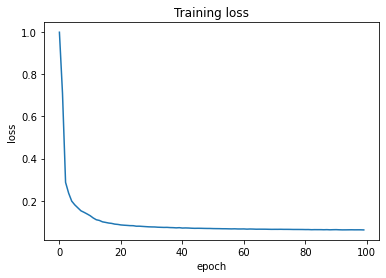

In [10]:
plt.title("Training loss")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.plot(losses)
plt.show()

### Generate samples

In [12]:
# ------------------------ #
#     Generate samples     #
# ------------------------ #
model = model.eval()

num_samples = 16
shape = (num_samples, 1, 28, 28)

def to_img(x):
    # Tensor to images
    x.clip_(min=-1, max=1)
    x = (x + 1.) / 0.5

    x = make_grid(x, nrow=4)

    x = (x.permute(1, 2, 0).numpy() * 255.).astype(np.uint8)
    x = x[:, :, [2, 1, 0]]
    return x

stds = []
imgs = []
with torch.no_grad():
    x = get_samples_from_prior(shape).to(device)    # Noise

    timesteps = torch.linspace(T, sampling_eps, N, device=device)
    dt = sampling_eps

    for i, t in enumerate(tqdm(timesteps, desc="Generating samples")):
        t = t[None, None].expand(num_samples, 1)
        std = get_marginal_std(t)

        score = model(x, std)
        drift = std[:, :, None, None] ** 2 * score

        x = x + drift * dt
        if i % 100 == 0:
            stds.append(std[0].item())
            imgs.append(to_img(x.cpu()))
    
    result = to_img(x.cpu())
    imgs.append(result)

Generating samples: 100%|██████████| 10000/10000 [01:24<00:00, 118.76it/s]


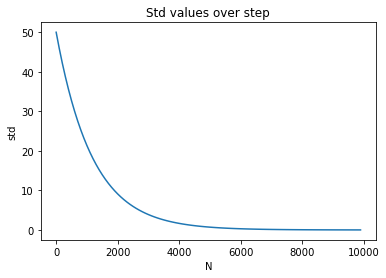

In [16]:
plt.title("Std values over step")
plt.xlabel("N")
plt.ylabel("std")
plt.plot([i*100 for i in range(100)], stds)
plt.show()

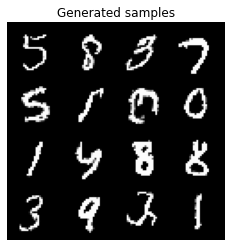

In [27]:
plt.title("Generated samples")
plt.imshow(result)
plt.axis("off")
plt.show()

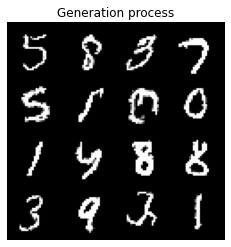

In [28]:
fig = plt.figure()
plt.title("Generation process")
plt.axis("off")
plots = []
for img in imgs:
    plots.append([plt.imshow(img, animated=True)])

ani = animation.ArtistAnimation(fig, plots, interval=150, repeat_delay=300, blit=True)
HTML(ani.to_jshtml())

### Inpainting

In [34]:
# ------------------------ #
#     Generate samples     #
# ------------------------ #
model = model.eval()

num_samples = 16
X = next(iter(train_loader))[0][:num_samples].to(device)
shape = X.size()

def to_img(x):
    # Tensor to images
    x.clip_(min=-1, max=1)
    x = (x + 1.) / 0.5

    x = make_grid(x, nrow=4)

    x = (x.permute(1, 2, 0).numpy() * 255.).astype(np.uint8)
    x = x[:, :, [2, 1, 0]]
    return x

imgs = []
with torch.no_grad():
    mask = torch.ones(*shape, device=device)
    mask[..., :X.size(-1) // 2].fill_(0)

    prior = get_samples_from_prior(shape).to(device)    # Noise
    masked_X = X * mask
    x = masked_X + prior * (1 - mask)

    timesteps = torch.linspace(T, sampling_eps, N, device=device)
    dt = sampling_eps

    for i, t in enumerate(tqdm(timesteps, desc="Inpainting")):
        t = t[None, None].expand(num_samples, 1)
        std = get_marginal_std(t)

        score = model(x, std)
        drift = std[:, :, None, None] ** 2 * score
        x = x + drift * dt
        
        masked_data = masked_X + torch.randn_like(x) * std[:, :, None, None]
        x = x * (1. - mask) + masked_data * mask

        if i % 100 == 0:
            imgs.append(to_img((masked_X + x * (1 - mask)).cpu()))
    
    result = to_img((masked_X + x * (1 - mask)).cpu())
    imgs.append(result)

original_imgs = to_img(X.cpu())
masked_imgs = to_img(masked_X.cpu())

Inpainting: 100%|██████████| 10000/10000 [01:25<00:00, 117.53it/s]


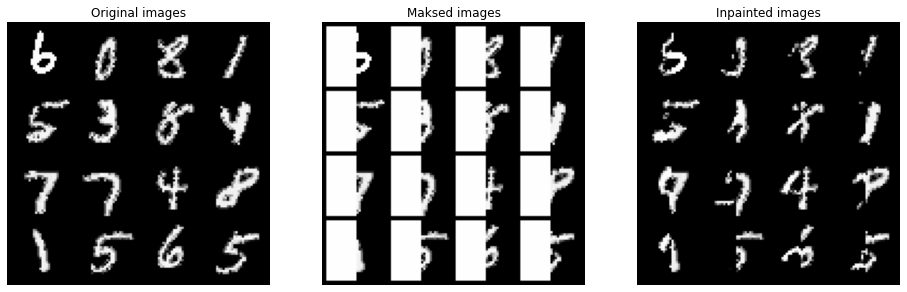

In [37]:
fig = plt.figure(figsize=(16, 9))
plt.subplot(1, 3, 1)
plt.title("Original images")
plt.imshow(original_imgs)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("Maksed images")
plt.imshow(masked_imgs)
plt.axis("off")

plt.subplot(1, 3, 3)
plt.title("Inpainted images")
plt.imshow(result)
plt.axis("off")


plt.show()

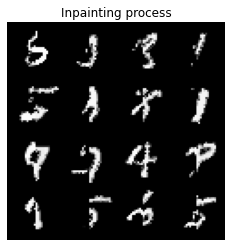

In [36]:
fig = plt.figure()
plt.title("Inpainting process")
plt.axis("off")
plots = []
for img in imgs:
    plots.append([plt.imshow(img, animated=True)])

ani = animation.ArtistAnimation(fig, plots, interval=150, repeat_delay=300, blit=True)
HTML(ani.to_jshtml())